In [1]:
# Import the packages

import pandas as pd
import numpy as np

# Import the files

uk_cases = pd.read_csv('covid_19_uk_cases.csv')
uk_vaccinated = pd.read_csv('covid_19_uk_vaccinated.csv')
tweets = pd.read_csv('tweets.csv')

In [2]:
# View the Data
print(uk_cases.shape)
print(uk_cases.dtypes)
print(uk_vaccinated.shape)
print(uk_vaccinated.dtypes)
uk_cases

(7584, 12)
Province/State               object
Country/Region               object
Lat                         float64
Long                        float64
ISO 3166-1 Alpha 3-Codes     object
Sub-region Name              object
Intermediate Region Code      int64
Date                         object
Deaths                      float64
Cases                       float64
Recovered                   float64
Hospitalised                float64
dtype: object
(7584, 11)
Province/State               object
Country/Region               object
Lat                         float64
Long                        float64
ISO 3166-1 Alpha 3-Codes     object
Sub-region Name              object
Intermediate Region Code      int64
Date                         object
Vaccinated                    int64
First Dose                    int64
Second Dose                   int64
dtype: object


,Province/State,Country/Region,Lat,Long,ISO 3166-1 Alpha 3-Codes,Sub-region Name,Intermediate Region Code,Date,Deaths,Cases,Recovered,Hospitalised
0,Anguilla,United Kingdom,18.2206,-63.0686,AIA,Latin America and the Caribbean,29,2020-01-22,0.0,0.0,0.0,0.0
1,Anguilla,United Kingdom,18.2206,-63.0686,AIA,Latin America and the Caribbean,29,2020-01-23,0.0,0.0,0.0,0.0
2,Anguilla,United Kingdom,18.2206,-63.0686,AIA,Latin America and the Caribbean,29,2020-01-24,0.0,0.0,0.0,0.0
3,Anguilla,United Kingdom,18.2206,-63.0686,AIA,Latin America and the Caribbean,29,2020-01-25,0.0,0.0,0.0,0.0
4,Anguilla,United Kingdom,18.2206,-63.0686,AIA,Latin America and the Caribbean,29,2020-01-26,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...
7579,Others,United Kingdom,55.3781,-3.4360,GBR,Northern Europe,0,2021-10-10,137735.0,8154306.0,0.0,378.0
7580,Others,United Kingdom,55.3781,-3.4360,GBR,Northern Europe,0,2021-10-11,137763.0,8193769.0,0.0,386.0
7581,Others,United Kingdom,55.3781,-3.4360,GBR,Northern Europe,0,2021-10-12,137944.0,8231437.0,0.0,386.0
7582,Others,United Kingdom,55.3781,-3.4360,GBR,Northern Europe,0,2021-10-13,138080.0,8272883.0,0.0,0.0


# Identify the area that has the greatest number of people who received a first dose

In [3]:
# Sense checking the data which fields can be used as keys
print(uk_cases['ISO 3166-1 Alpha 3-Codes'].unique())

['AIA' 'BMU' 'VGB' 'CYM' 'Others' 'FLK' 'GIB' 'IMN' 'MSR' 'GBR' 'TCA']


In [4]:
# Since the province/state field looks more complete (12 entries vs 11) I will be using the province/state field
print(uk_cases['Province/State'].unique())

['Anguilla' 'Bermuda' 'British Virgin Islands' 'Cayman Islands'
 'Channel Islands' 'Falkland Islands (Malvinas)' 'Gibraltar' 'Isle of Man'
 'Montserrat' 'Saint Helena, Ascension and Tristan da Cunha'
 'Turks and Caicos Islands' 'Others']


In [5]:
# As both dataframes contain information on country, cases and vaccinations let's merge them first
# To make sure both have the region and the date we create a key for both tables on country region and date

uk_cases['key'] = uk_cases['Province/State'] + '|' + uk_cases['Date']

uk_vaccinated['key'] = uk_vaccinated['Province/State'] + '|' + uk_vaccinated['Date']

print(uk_cases['key'].head())
print(uk_vaccinated['key'].head())

uk_cases

0    Anguilla|2020-01-22
1    Anguilla|2020-01-23
2    Anguilla|2020-01-24
3    Anguilla|2020-01-25
4    Anguilla|2020-01-26
Name: key, dtype: object
0    Anguilla|2020-01-22
1    Anguilla|2020-01-23
2    Anguilla|2020-01-24
3    Anguilla|2020-01-25
4    Anguilla|2020-01-26
Name: key, dtype: object


,Province/State,Country/Region,Lat,Long,ISO 3166-1 Alpha 3-Codes,Sub-region Name,Intermediate Region Code,Date,Deaths,Cases,Recovered,Hospitalised,key
0,Anguilla,United Kingdom,18.2206,-63.0686,AIA,Latin America and the Caribbean,29,2020-01-22,0.0,0.0,0.0,0.0,Anguilla|2020-01-22
1,Anguilla,United Kingdom,18.2206,-63.0686,AIA,Latin America and the Caribbean,29,2020-01-23,0.0,0.0,0.0,0.0,Anguilla|2020-01-23
2,Anguilla,United Kingdom,18.2206,-63.0686,AIA,Latin America and the Caribbean,29,2020-01-24,0.0,0.0,0.0,0.0,Anguilla|2020-01-24
3,Anguilla,United Kingdom,18.2206,-63.0686,AIA,Latin America and the Caribbean,29,2020-01-25,0.0,0.0,0.0,0.0,Anguilla|2020-01-25
4,Anguilla,United Kingdom,18.2206,-63.0686,AIA,Latin America and the Caribbean,29,2020-01-26,0.0,0.0,0.0,0.0,Anguilla|2020-01-26
...,...,...,...,...,...,...,...,...,...,...,...,...,...
7579,Others,United Kingdom,55.3781,-3.4360,GBR,Northern Europe,0,2021-10-10,137735.0,8154306.0,0.0,378.0,Others|2021-10-10
7580,Others,United Kingdom,55.3781,-3.4360,GBR,Northern Europe,0,2021-10-11,137763.0,8193769.0,0.0,386.0,Others|2021-10-11
7581,Others,United Kingdom,55.3781,-3.4360,GBR,Northern Europe,0,2021-10-12,137944.0,8231437.0,0.0,386.0,Others|2021-10-12
7582,Others,United Kingdom,55.3781,-3.4360,GBR,Northern Europe,0,2021-10-13,138080.0,8272883.0,0.0,0.0,Others|2021-10-13


In [6]:
# Now a merge will be attempted

covid_data = pd.merge(uk_cases, uk_vaccinated, how = 'inner', on = 'key')

print(covid_data.dtypes)
covid_data.head()

Province/State_x               object
Country/Region_x               object
Lat_x                         float64
Long_x                        float64
ISO 3166-1 Alpha 3-Codes_x     object
Sub-region Name_x              object
Intermediate Region Code_x      int64
Date_x                         object
Deaths                        float64
Cases                         float64
Recovered                     float64
Hospitalised                  float64
key                            object
Province/State_y               object
Country/Region_y               object
Lat_y                         float64
Long_y                        float64
ISO 3166-1 Alpha 3-Codes_y     object
Sub-region Name_y              object
Intermediate Region Code_y      int64
Date_y                         object
Vaccinated                      int64
First Dose                      int64
Second Dose                     int64
dtype: object


,Province/State_x,Country/Region_x,Lat_x,Long_x,ISO 3166-1 Alpha 3-Codes_x,Sub-region Name_x,Intermediate Region Code_x,Date_x,Deaths,Cases,...,Country/Region_y,Lat_y,Long_y,ISO 3166-1 Alpha 3-Codes_y,Sub-region Name_y,Intermediate Region Code_y,Date_y,Vaccinated,First Dose,Second Dose
0,Anguilla,United Kingdom,18.2206,-63.0686,AIA,Latin America and the Caribbean,29,2020-01-22,0.0,0.0,...,United Kingdom,18.2206,-63.0686,AIA,Latin America and the Caribbean,29,2020-01-22,0,0,0
1,Anguilla,United Kingdom,18.2206,-63.0686,AIA,Latin America and the Caribbean,29,2020-01-23,0.0,0.0,...,United Kingdom,18.2206,-63.0686,AIA,Latin America and the Caribbean,29,2020-01-23,0,0,0
2,Anguilla,United Kingdom,18.2206,-63.0686,AIA,Latin America and the Caribbean,29,2020-01-24,0.0,0.0,...,United Kingdom,18.2206,-63.0686,AIA,Latin America and the Caribbean,29,2020-01-24,0,0,0
3,Anguilla,United Kingdom,18.2206,-63.0686,AIA,Latin America and the Caribbean,29,2020-01-25,0.0,0.0,...,United Kingdom,18.2206,-63.0686,AIA,Latin America and the Caribbean,29,2020-01-25,0,0,0
4,Anguilla,United Kingdom,18.2206,-63.0686,AIA,Latin America and the Caribbean,29,2020-01-26,0.0,0.0,...,United Kingdom,18.2206,-63.0686,AIA,Latin America and the Caribbean,29,2020-01-26,0,0,0


In [7]:
# Create a new DF from the merged one 
covid_data_clean = covid_data[['Province/State_x', 'Country/Region_x', 'Sub-region Name_x',
                              'Date_x', 'Deaths', 'Cases', 'Recovered',
                              'Vaccinated', 'First Dose', 'Second Dose']]

covid_data_clean

,Province/State_x,Country/Region_x,Sub-region Name_x,Date_x,Deaths,Cases,Recovered,Vaccinated,First Dose,Second Dose
0,Anguilla,United Kingdom,Latin America and the Caribbean,2020-01-22,0.0,0.0,0.0,0,0,0
1,Anguilla,United Kingdom,Latin America and the Caribbean,2020-01-23,0.0,0.0,0.0,0,0,0
2,Anguilla,United Kingdom,Latin America and the Caribbean,2020-01-24,0.0,0.0,0.0,0,0,0
3,Anguilla,United Kingdom,Latin America and the Caribbean,2020-01-25,0.0,0.0,0.0,0,0,0
4,Anguilla,United Kingdom,Latin America and the Caribbean,2020-01-26,0.0,0.0,0.0,0,0,0
...,...,...,...,...,...,...,...,...,...,...
7579,Others,United Kingdom,Northern Europe,2021-10-10,137735.0,8154306.0,0.0,1070,1216,1070
7580,Others,United Kingdom,Northern Europe,2021-10-11,137763.0,8193769.0,0.0,1300,1604,1300
7581,Others,United Kingdom,Northern Europe,2021-10-12,137944.0,8231437.0,0.0,1482,2027,1482
7582,Others,United Kingdom,Northern Europe,2021-10-13,138080.0,8272883.0,0.0,0,0,0


In [8]:
# Clean up the header names

covid_data_clean.rename(columns = {'Province/State_x': 'Province/State', 'Country/Region_x' : 'Country/Region',
                                   'Sub-region Name_x' : 'Sub-region', 'Date_x' : 'Date'}, inplace = True)

covid_data_clean

C:\Users\patri\AppData\Local\Temp\ipykernel_11720\2030859477.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  covid_data_clean.rename(columns = {'Province/State_x': 'Province/State', 'Country/Region_x' : 'Country/Region',


,Province/State,Country/Region,Sub-region,Date,Deaths,Cases,Recovered,Vaccinated,First Dose,Second Dose
0,Anguilla,United Kingdom,Latin America and the Caribbean,2020-01-22,0.0,0.0,0.0,0,0,0
1,Anguilla,United Kingdom,Latin America and the Caribbean,2020-01-23,0.0,0.0,0.0,0,0,0
2,Anguilla,United Kingdom,Latin America and the Caribbean,2020-01-24,0.0,0.0,0.0,0,0,0
3,Anguilla,United Kingdom,Latin America and the Caribbean,2020-01-25,0.0,0.0,0.0,0,0,0
4,Anguilla,United Kingdom,Latin America and the Caribbean,2020-01-26,0.0,0.0,0.0,0,0,0
...,...,...,...,...,...,...,...,...,...,...
7579,Others,United Kingdom,Northern Europe,2021-10-10,137735.0,8154306.0,0.0,1070,1216,1070
7580,Others,United Kingdom,Northern Europe,2021-10-11,137763.0,8193769.0,0.0,1300,1604,1300
7581,Others,United Kingdom,Northern Europe,2021-10-12,137944.0,8231437.0,0.0,1482,2027,1482
7582,Others,United Kingdom,Northern Europe,2021-10-13,138080.0,8272883.0,0.0,0,0,0


In [9]:
# Check for unique Sub-Regions
print(covid_data_clean['Sub-region'].unique())

['Latin America and the Caribbean' 'Northern America' 'Northern Europe'
 'Southern Europe']


In [10]:
# Convert the date from obj to datetime
covid_data_clean['Date'] = pd.to_datetime(covid_data_clean['Date'])

print(covid_data_clean.dtypes)

Province/State            object
Country/Region            object
Sub-region                object
Date              datetime64[ns]
Deaths                   float64
Cases                    float64
Recovered                float64
Vaccinated                 int64
First Dose                 int64
Second Dose                int64
dtype: object


C:\Users\patri\AppData\Local\Temp\ipykernel_11720\2705248940.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  covid_data_clean['Date'] = pd.to_datetime(covid_data_clean['Date'])


In [11]:
# Now we have a DataSet that we can work with, Let's determine the number of cases across the UK

cases_province = covid_data_clean.groupby('Province/State')

In [12]:
cases_province.sum().sort_values('Cases', ascending = False)

,Deaths,Cases,Recovered,Vaccinated,First Dose,Second Dose
Province/State,,,,,,
Others,46987145.0,1.621651e+09,4115.0,2466669,2583151,2466669
Channel Islands,37130.0,1.957978e+06,1027626.0,3139385,3287646,3139385
Gibraltar,25412.0,1.413853e+06,956103.0,5606041,5870786,5606041
Isle of Man,15051.0,8.871330e+05,328319.0,4036345,4226984,4036345
Turks and Caicos Islands,5612.0,7.526180e+05,515923.0,2915136,3052822,2915136
Bermuda,10353.0,6.854420e+05,363999.0,2690908,2817981,2690908
British Virgin Islands,3573.0,2.849610e+05,64359.0,4933315,5166303,4933315
Cayman Islands,911.0,2.177560e+05,152052.0,3363624,3522476,3363624
Anguilla,24.0,3.531500e+04,12708.0,4709072,4931470,4709072


In [13]:
# Let's check the proportion of people who only got one dose of the vaccination. 
covid_data_clean['FirstDoseOnly'] = covid_data_clean['First Dose'] - covid_data_clean['Second Dose']

# The total number of people who are either first or second dose can then be calculated by second + first only
covid_data_clean['VaccinatedPopulation'] = covid_data_clean['Second Dose'] + covid_data_clean['FirstDoseOnly']

# Now I can identify the proportion of the total population who only received a fist dose 
covid_data_clean['FirstDoseProportion'] = covid_data_clean['FirstDoseOnly'] / covid_data_clean['VaccinatedPopulation']

covid_data_clean

C:\Users\patri\AppData\Local\Temp\ipykernel_11720\1197192359.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  covid_data_clean['FirstDoseOnly'] = covid_data_clean['First Dose'] - covid_data_clean['Second Dose']
C:\Users\patri\AppData\Local\Temp\ipykernel_11720\1197192359.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  covid_data_clean['VaccinatedPopulation'] = covid_data_clean['Second Dose'] + covid_data_clean['FirstDoseOnly']
C:\Users\patri\AppData\Local\Temp\ipykernel_11720\1197192359.py:8: Setting

,Province/State,Country/Region,Sub-region,Date,Deaths,Cases,Recovered,Vaccinated,First Dose,Second Dose,FirstDoseOnly,VaccinatedPopulation,FirstDoseProportion
0,Anguilla,United Kingdom,Latin America and the Caribbean,2020-01-22,0.0,0.0,0.0,0,0,0,0,0,NaN
1,Anguilla,United Kingdom,Latin America and the Caribbean,2020-01-23,0.0,0.0,0.0,0,0,0,0,0,NaN
2,Anguilla,United Kingdom,Latin America and the Caribbean,2020-01-24,0.0,0.0,0.0,0,0,0,0,0,NaN
3,Anguilla,United Kingdom,Latin America and the Caribbean,2020-01-25,0.0,0.0,0.0,0,0,0,0,0,NaN
4,Anguilla,United Kingdom,Latin America and the Caribbean,2020-01-26,0.0,0.0,0.0,0,0,0,0,0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...
7579,Others,United Kingdom,Northern Europe,2021-10-10,137735.0,8154306.0,0.0,1070,1216,1070,146,1216,0.120066
7580,Others,United Kingdom,Northern Europe,2021-10-11,137763.0,8193769.0,0.0,1300,1604,1300,304,1604,0.189526
7581,Others,United Kingdom,Northern Europe,2021-10-12,137944.0,8231437.0,0.0,1482,2027,1482,545,2027,0.268870
7582,Others,United Kingdom,Northern Europe,2021-10-13,138080.0,8272883.0,0.0,0,0,0,0,0,NaN


In [14]:
# Identify the area that has the greatest number of people who received a first dose but not a second one
cases_province = covid_data_clean.groupby('Province/State')
cases_province.sum().sort_values('FirstDoseOnly', ascending = False)

,Deaths,Cases,Recovered,Vaccinated,First Dose,Second Dose,FirstDoseOnly,VaccinatedPopulation,FirstDoseProportion
Province/State,,,,,,,,,
Gibraltar,25412.0,1.413853e+06,956103.0,5606041,5870786,5606041,264745,5870786,-252.854055
Montserrat,539.0,9.556000e+03,6376.0,5157560,5401128,5157560,243568,5401128,-252.850490
British Virgin Islands,3573.0,2.849610e+05,64359.0,4933315,5166303,4933315,232988,5166303,-252.846322
Anguilla,24.0,3.531500e+04,12708.0,4709072,4931470,4709072,222398,4931470,-252.843137
Isle of Man,15051.0,8.871330e+05,328319.0,4036345,4226984,4036345,190639,4226984,-252.838177
Falkland Islands (Malvinas),0.0,2.048200e+04,14754.0,3587869,3757307,3587869,169438,3757307,-252.847920
Cayman Islands,911.0,2.177560e+05,152052.0,3363624,3522476,3363624,158852,3522476,-252.853196
Channel Islands,37130.0,1.957978e+06,1027626.0,3139385,3287646,3139385,148261,3287646,-252.844271
Turks and Caicos Islands,5612.0,7.526180e+05,515923.0,2915136,3052822,2915136,137686,3052822,-252.841623


In [15]:
# To show this information on a higher level I am going to do this as well on region level
cases_province = covid_data_clean.groupby('Sub-region')
cases_province.sum().sort_values('FirstDoseOnly', ascending = False)

,Deaths,Cases,Recovered,Vaccinated,First Dose,Second Dose,FirstDoseOnly,VaccinatedPopulation,FirstDoseProportion
Sub-region,,,,,,,,,
Latin America and the Caribbean,10659.0,1.320688e+06,766172.0,24666576,25831506,24666576,1164930,25831506,-1517.082688
Northern Europe,47039330.0,1.624497e+09,1361195.0,11884820,12446091,11884820,561271,12446091,-1011.386154
Southern Europe,25412.0,1.413853e+06,956103.0,5606041,5870786,5606041,264745,5870786,-252.854055
Northern America,10353.0,6.854420e+05,363999.0,2690908,2817981,2690908,127073,2817981,-252.852192


In [16]:
# LEt's check if there is a difference over time for the first and second dose application

cases_over_time = covid_data_clean[['Province/State','Date','FirstDoseOnly', 'FirstDoseProportion']]

cases_over_time['Month'] = cases_over_time['Date'].dt.month
cases_over_time['Year'] = cases_over_time['Date'].dt.year

cases_over_time['dateindex'] = cases_over_time['Date'].dt.to_period('M')
print(cases_over_time.dtypes)
cases_over_time

C:\Users\patri\AppData\Local\Temp\ipykernel_11720\1865369172.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cases_over_time['Month'] = cases_over_time['Date'].dt.month
C:\Users\patri\AppData\Local\Temp\ipykernel_11720\1865369172.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cases_over_time['Year'] = cases_over_time['Date'].dt.year


Province/State                 object
Date                   datetime64[ns]
FirstDoseOnly                   int64
FirstDoseProportion           float64
Month                           int64
Year                            int64
dateindex                   period[M]
dtype: object


C:\Users\patri\AppData\Local\Temp\ipykernel_11720\1865369172.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cases_over_time['dateindex'] = cases_over_time['Date'].dt.to_period('M')


,Province/State,Date,FirstDoseOnly,FirstDoseProportion,Month,Year,dateindex
0,Anguilla,2020-01-22,0,NaN,1,2020,2020-01
1,Anguilla,2020-01-23,0,NaN,1,2020,2020-01
2,Anguilla,2020-01-24,0,NaN,1,2020,2020-01
3,Anguilla,2020-01-25,0,NaN,1,2020,2020-01
4,Anguilla,2020-01-26,0,NaN,1,2020,2020-01
...,...,...,...,...,...,...,...
7579,Others,2021-10-10,146,0.120066,10,2021,2021-10
7580,Others,2021-10-11,304,0.189526,10,2021,2021-10
7581,Others,2021-10-12,545,0.268870,10,2021,2021-10
7582,Others,2021-10-13,0,NaN,10,2021,2021-10


In [17]:
# Show how the proportion of people receiving a first dose has changed by the end of each month
cases_grouped = cases_over_time.groupby(pd.Grouper(freq = 'm', key = 'Date'))['FirstDoseProportion'].last().\
ffill().reset_index()

cases_grouped

,Date,FirstDoseProportion
0,2020-01-31,NaN
1,2020-02-29,NaN
2,2020-03-31,NaN
3,2020-04-30,NaN
4,2020-05-31,NaN
5,2020-06-30,NaN
6,2020-07-31,NaN
7,2020-08-31,NaN
8,2020-09-30,NaN
9,2020-10-31,NaN


In [18]:
# Pivoting the data so that we get the provinces on columns 
cases_pivot = cases_over_time.pivot(index = 'Date' , columns = 'Province/State', values = 'FirstDoseProportion')

cases_pivot.dropna()

Province/State,Anguilla,Bermuda,British Virgin Islands,Cayman Islands,Channel Islands,Falkland Islands (Malvinas),Gibraltar,Isle of Man,Montserrat,Others,"Saint Helena, Ascension and Tristan da Cunha",Turks and Caicos Islands
Date,,,,,,,,,,,,
2021-01-11,0.856824,0.856864,0.856874,0.856815,0.856819,0.856884,0.856843,0.856858,0.856869,0.856874,0.856907,0.856840
2021-01-12,0.922629,0.922632,0.922646,0.922632,0.922606,0.922651,0.922644,0.922628,0.922658,0.922599,0.922662,0.922655
2021-01-13,0.965072,0.965047,0.965063,0.965059,0.965072,0.965046,0.965068,0.965067,0.965054,0.965063,0.965082,0.965087
2021-01-14,0.983400,0.983423,0.983408,0.983412,0.983400,0.983383,0.983404,0.983405,0.983388,0.983408,0.983391,0.983386
2021-01-15,0.987667,0.987695,0.987668,0.987656,0.987653,0.987658,0.987671,0.987662,0.987669,0.987694,0.987695,0.987650
...,...,...,...,...,...,...,...,...,...,...,...,...
2021-10-08,0.082657,0.082588,0.082640,0.082492,0.082507,0.082840,0.082555,0.082749,0.082602,0.082616,0.082702,0.083010
2021-10-09,-0.066444,-0.066348,-0.066319,-0.066242,-0.065969,-0.066083,-0.066514,-0.066171,-0.066482,-0.066010,-0.066242,-0.066144
2021-10-10,0.120207,0.119910,0.120066,0.120024,0.119586,0.119910,0.120159,0.120101,0.119984,0.120066,0.119457,0.120390


In [19]:
# View the dataframe as a whole and remove the dates where there are no entries

pd.set_option('display.max_rows', None, 'display.max_columns', None)
print(cases_pivot.dropna())
cases_pivot.groupby()

Province/State  Anguilla   Bermuda  British Virgin Islands  Cayman Islands  \
Date                                                                         
2021-01-11      0.856824  0.856864                0.856874        0.856815   
2021-01-12      0.922629  0.922632                0.922646        0.922632   
2021-01-13      0.965072  0.965047                0.965063        0.965059   
2021-01-14      0.983400  0.983423                0.983408        0.983412   
2021-01-15      0.987667  0.987695                0.987668        0.987656   
2021-01-16      0.991156  0.991164                0.991159        0.991175   
2021-01-17      0.988227  0.988252                0.988236        0.988217   
2021-01-18      0.977646  0.977624                0.977637        0.977656   
2021-01-19      0.989038  0.989024                0.989059        0.989043   
2021-01-20      0.990620  0.990601                0.990622        0.990610   
2021-01-21      0.993261  0.993250                0.993257      

TypeError: You have to supply one of 'by' and 'level'

# Visualizing the Data

* Create a chart that communicates the number of individuals who received a second dose compared to those who received their first dose

* Create a visualization that communicates the number of deaths per month in each region, review if there are any peaks

* Identify the region with the highest number of recoveries. A visualization that communcicates  the number of recoveries per month in each area. Review if that has been consistent over time.

In [21]:
# Create a subset of the data containing date, regions and vaccination data
cases_visualized = covid_data_clean[['Province/State','Date','First Dose', 'Second Dose', 
                                     'FirstDoseOnly', 'FirstDoseProportion']]

cases_visualized

,Province/State,Date,First Dose,Second Dose,FirstDoseOnly,FirstDoseProportion
0,Anguilla,2020-01-22,0,0,0,NaN
1,Anguilla,2020-01-23,0,0,0,NaN
2,Anguilla,2020-01-24,0,0,0,NaN
3,Anguilla,2020-01-25,0,0,0,NaN
4,Anguilla,2020-01-26,0,0,0,NaN
5,Anguilla,2020-01-27,0,0,0,NaN
6,Anguilla,2020-01-28,0,0,0,NaN
7,Anguilla,2020-01-29,0,0,0,NaN
8,Anguilla,2020-01-30,0,0,0,NaN
9,Anguilla,2020-01-31,0,0,0,NaN


In [22]:
# Import the Libraries for visualizations 

import seaborn as sns
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.dates import *

# Group the data by province and aggregate first and second dose population
cases_visualized = cases_visualized.groupby('Province/State')[['First Dose', 'Second Dose']].sum().reset_index()

In [23]:
# Calculate the difference per region for the sum of first dose and second
cases_visualized['Difference'] = cases_visualized['First Dose'] - cases_visualized['Second Dose']

# Calculate the ratio of interest as people who are eligible for the second dose
cases_visualized['ratio of interest (%)'] = round(cases_visualized['Difference'] * 100 / cases_visualized['First Dose'], 2)

# Calculate the ratio of people who have received the second dose over the first
cases_visualized['first percentage (%)'] = round(cases_visualized['Second Dose'] / cases_visualized['First Dose'] * 100, 2)

cases_visualized

,Province/State,First Dose,Second Dose,Difference,ratio of interest (%),first percentage (%)
0,Anguilla,4931470,4709072,222398,4.51,95.49
1,Bermuda,2817981,2690908,127073,4.51,95.49
2,British Virgin Islands,5166303,4933315,232988,4.51,95.49
3,Cayman Islands,3522476,3363624,158852,4.51,95.49
4,Channel Islands,3287646,3139385,148261,4.51,95.49
5,Falkland Islands (Malvinas),3757307,3587869,169438,4.51,95.49
6,Gibraltar,5870786,5606041,264745,4.51,95.49
7,Isle of Man,4226984,4036345,190639,4.51,95.49
8,Montserrat,5401128,5157560,243568,4.51,95.49
9,Others,2583151,2466669,116482,4.51,95.49


NameError: name 'plot' is not defined

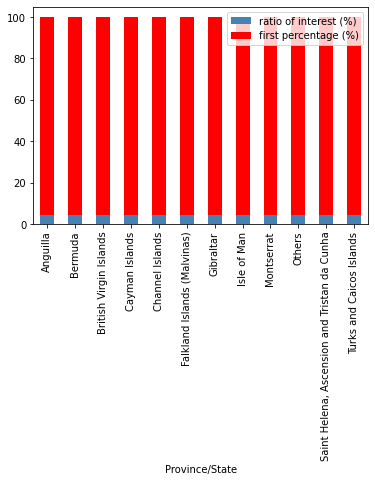

In [38]:
# Create a plot that shows the percentage of vaccinated vs unvaccinated people in the datase

cases_visualized[['Province/State','ratio of interest (%)', 'first percentage (%)']]\
.set_index('Province/State').plot(kind = 'bar', stacked = True, color = ['steelblue', 'red'])

plot.patch.set_facecolor('white')

plt.savefig('percentage of vaccinated vs unvaccinated people', facecolor = 'white')

In [25]:
# Group the data by province and data and aggregate the death count
cases_visualized2 = covid_data_clean[['Province/State','Date','Deaths', 'First Dose', 'Second Dose', 
                                     'FirstDoseOnly', 'FirstDoseProportion']]


In [26]:
print(cases_visualized2.dtypes)
cases_visualized2

Province/State                 object
Date                   datetime64[ns]
Deaths                        float64
First Dose                      int64
Second Dose                     int64
FirstDoseOnly                   int64
FirstDoseProportion           float64
dtype: object


,Province/State,Date,Deaths,First Dose,Second Dose,FirstDoseOnly,FirstDoseProportion
0,Anguilla,2020-01-22,0.0,0,0,0,NaN
1,Anguilla,2020-01-23,0.0,0,0,0,NaN
2,Anguilla,2020-01-24,0.0,0,0,0,NaN
3,Anguilla,2020-01-25,0.0,0,0,0,NaN
4,Anguilla,2020-01-26,0.0,0,0,0,NaN
5,Anguilla,2020-01-27,0.0,0,0,0,NaN
6,Anguilla,2020-01-28,0.0,0,0,0,NaN
7,Anguilla,2020-01-29,0.0,0,0,0,NaN
8,Anguilla,2020-01-30,0.0,0,0,0,NaN
9,Anguilla,2020-01-31,0.0,0,0,0,NaN


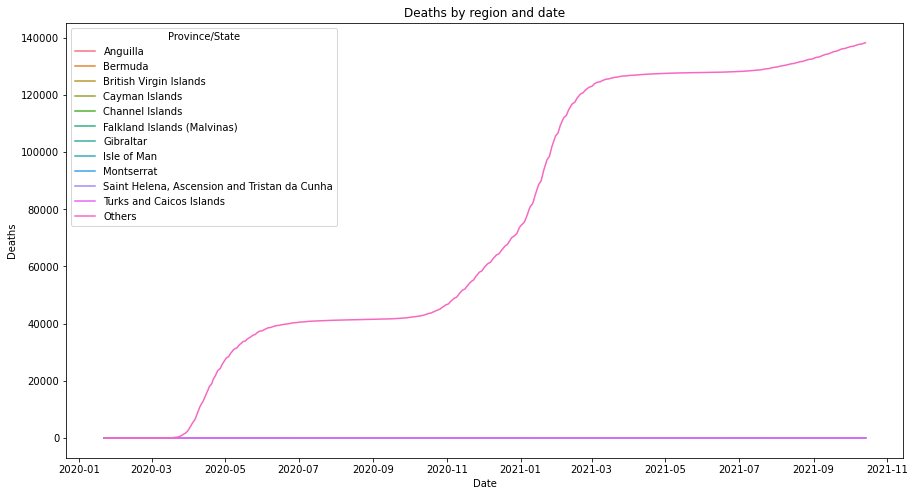

In [27]:
# Create a plot to display the data across all reagions
fig, temp_ax = plt.subplots()
fig.set_size_inches(15, 8)
sns.lineplot(x = 'Date',
             y = 'Deaths',
             hue = 'Province/State',
             data = cases_visualized2)\
.set_title('Deaths by region and date')
x_labels = cases_visualized2['Date'].dt.strftime('%Y-%m-%d')
plt.show()

In [28]:
# As this visual is almost impossible to analyze, I will be excluding the 'others' group
cases_visualized2 = cases_visualized2.groupby(['Province/State', 'Date']).agg({'Deaths': ['sum']})
cases_visualized2.columns = ['Death_sum']

# Dropping the 'Others' category
cases_visualized2 = cases_visualized2.drop('Others')
# Resetting the index so they can be used for the analysis
cases_visualized2 = cases_visualized2.reset_index()
# View the new dataframe
print(cases_visualized2.dtypes)
cases_visualized2

Province/State            object
Date              datetime64[ns]
Death_sum                float64
dtype: object


,Province/State,Date,Death_sum
0,Anguilla,2020-01-22,0.0
1,Anguilla,2020-01-23,0.0
2,Anguilla,2020-01-24,0.0
3,Anguilla,2020-01-25,0.0
4,Anguilla,2020-01-26,0.0
5,Anguilla,2020-01-27,0.0
6,Anguilla,2020-01-28,0.0
7,Anguilla,2020-01-29,0.0
8,Anguilla,2020-01-30,0.0
9,Anguilla,2020-01-31,0.0


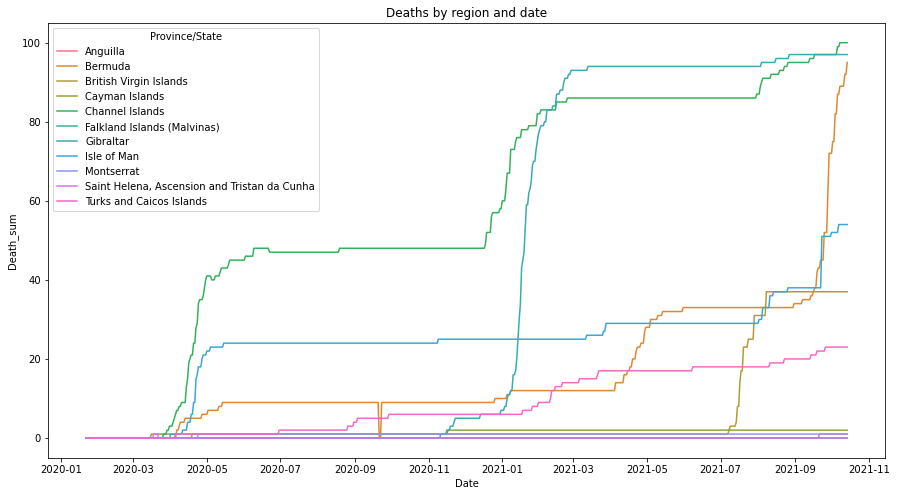

In [29]:
# Re-create the lineplot excluding the province/state that caused the skewed data
fig, temp_ax = plt.subplots()
fig.set_size_inches(15, 8)
sns.lineplot(x = 'Date',
             y = 'Death_sum',
             hue = 'Province/State',
             data = cases_visualized2)\
.set_title('Deaths by region and date')
x_labels = cases_visualized2['Date'].dt.strftime('%Y-%m-%d')
plt.show()

In [30]:
# Convert Date into Months and plot the same line graph 
cases_visualized2['Month'] = pd.to_datetime(cases_visualized2['Date'] + pd.offsets.MonthBegin(0))

cases_visualized2

,Province/State,Date,Death_sum,Month
0,Anguilla,2020-01-22,0.0,2020-02-01
1,Anguilla,2020-01-23,0.0,2020-02-01
2,Anguilla,2020-01-24,0.0,2020-02-01
3,Anguilla,2020-01-25,0.0,2020-02-01
4,Anguilla,2020-01-26,0.0,2020-02-01
5,Anguilla,2020-01-27,0.0,2020-02-01
6,Anguilla,2020-01-28,0.0,2020-02-01
7,Anguilla,2020-01-29,0.0,2020-02-01
8,Anguilla,2020-01-30,0.0,2020-02-01
9,Anguilla,2020-01-31,0.0,2020-02-01


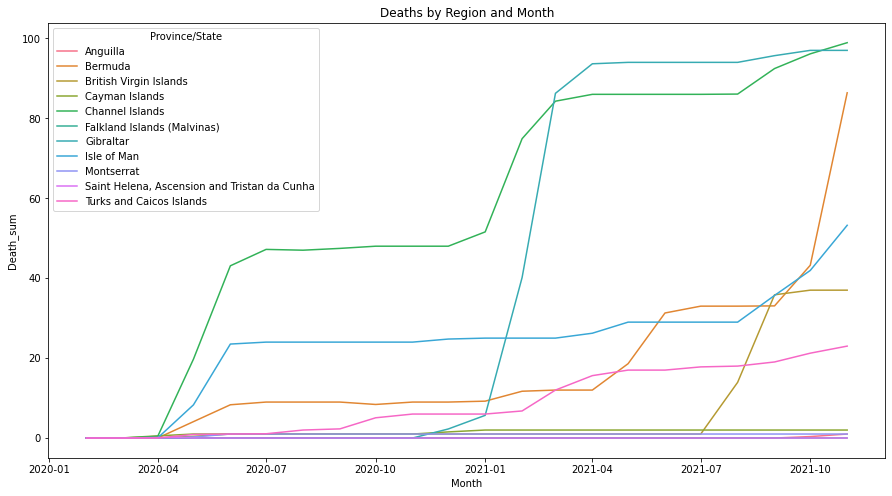

In [31]:
fig, temp_ax = plt.subplots()
fig.set_size_inches(15, 8)
sns.lineplot(x = 'Month',
             y = 'Death_sum',
             hue = 'Province/State',
             data = cases_visualized2,
             ci = None)\
.set_title('Deaths by Region and Month')
x_labels = cases_visualized2['Month'].dt.strftime('%Y-%m-%d')
plt.show()

fig.savefig('Death by Region and Month')

In [32]:
covid_data_clean.tail()

,Province/State,Country/Region,Sub-region,Date,Deaths,Cases,Recovered,Vaccinated,First Dose,Second Dose,FirstDoseOnly,VaccinatedPopulation,FirstDoseProportion
7579,Others,United Kingdom,Northern Europe,2021-10-10,137735.0,8154306.0,0.0,1070,1216,1070,146,1216,0.120066
7580,Others,United Kingdom,Northern Europe,2021-10-11,137763.0,8193769.0,0.0,1300,1604,1300,304,1604,0.189526
7581,Others,United Kingdom,Northern Europe,2021-10-12,137944.0,8231437.0,0.0,1482,2027,1482,545,2027,0.268870
7582,Others,United Kingdom,Northern Europe,2021-10-13,138080.0,8272883.0,0.0,0,0,0,0,0,NaN
7583,Others,United Kingdom,Northern Europe,2021-10-14,138237.0,8317439.0,0.0,0,0,0,0,0,NaN


In [34]:
# Aggregate the count of recovered cases and sort values of recovered cases in ascending order

# First a subset is created containing the required information
cases_visualized3 = covid_data_clean[['Province/State','Date','Recovered']]

# Next the data will be grouped by province/State
cases_visualized3_grouped = cases_visualized3.groupby('Province/State')['Recovered'].sum().sort_values()

print(cases_visualized3_grouped)

Province/State
Saint Helena, Ascension and Tristan da Cunha       1135.0
Others                                             4115.0
Montserrat                                         6376.0
Anguilla                                          12708.0
Falkland Islands (Malvinas)                       14754.0
British Virgin Islands                            64359.0
Cayman Islands                                   152052.0
Isle of Man                                      328319.0
Bermuda                                          363999.0
Turks and Caicos Islands                         515923.0
Gibraltar                                        956103.0
Channel Islands                                 1027626.0
Name: Recovered, dtype: float64


In [35]:
# Group Province/State and month to aggregate count of recovered cases
# Create a month column
cases_visualized3['Month'] = pd.to_datetime(cases_visualized3['Date'] + pd.offsets.MonthBegin(0))

# Next the data will be grouped by province/State and month
cases_visualized3_grouped_month = cases_visualized3.groupby(['Province/State', 'Month'])['Recovered'].sum()

print(cases_visualized3_grouped_month)

Province/State                                Month     
Anguilla                                      2020-02-01         0.0
                                              2020-03-01         0.0
                                              2020-04-01         0.0
                                              2020-05-01        29.0
                                              2020-06-01        93.0
                                              2020-07-01        90.0
                                              2020-08-01        93.0
                                              2020-09-01        93.0
                                              2020-10-01        90.0
                                              2020-11-01        93.0
                                              2020-12-01        90.0
                                              2021-01-01       219.0
                                              2021-02-01       436.0
                                              

C:\Users\patri\AppData\Local\Temp\ipykernel_11720\3650732666.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cases_visualized3['Month'] = pd.to_datetime(cases_visualized3['Date'] + pd.offsets.MonthBegin(0))


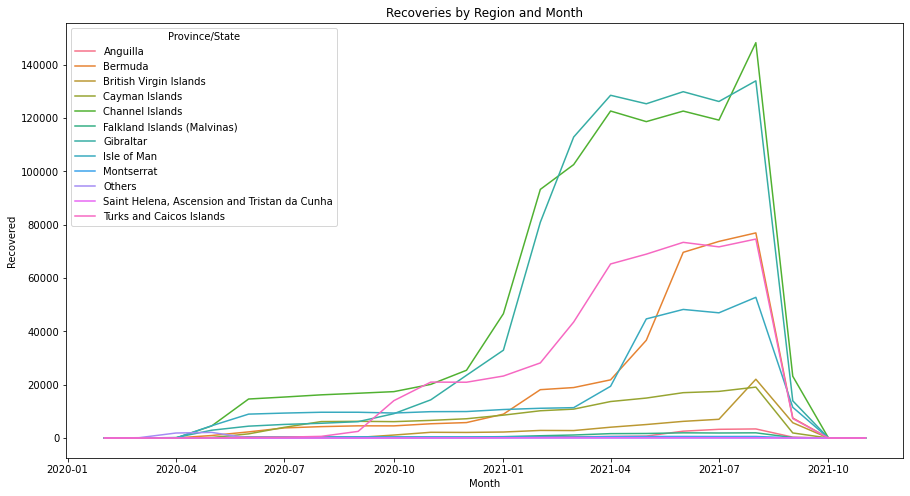

<Figure size 432x288 with 0 Axes>

In [36]:
# Reset the index from the the grouped set, so that the data can be visualized 
cases_visualized3_grouped_month = cases_visualized3_grouped_month.reset_index()

# Create a lineplot to visualize the trend of recovered cases across the months
fig, temp_ax = plt.subplots()
fig.set_size_inches(15, 8)
sns.lineplot(x = 'Month',
             y = 'Recovered',
             hue = 'Province/State',
             data = cases_visualized3_grouped_month,
             ci = None)\
.set_title('Recoveries by Region and Month')
x_labels = cases_visualized3_grouped_month['Month'].dt.strftime('%Y-%m-%d')
plt.show()

# Save the file as PNG.
plt.savefig('Recoveries by Region')

In [37]:
# Save the file as PNG.
fig.savefig('Recoveries by Region')

# Analyze the Twitter Data

The UK government wants you to analyze the tweets from twitter to better understand if there is a high volume of hashtags  related to covid. 

In [42]:
tweets = pd.read_csv('tweets.csv')

print(tweets.dtypes)
print(tweets.shape)

tweets.head()

created_at                    object
id                           float64
id_str                       float64
text                          object
truncated                     object
source                        object
in_reply_to_status_id        float64
in_reply_to_status_id_str    float64
in_reply_to_user_id          float64
in_reply_to_user_id_str      float64
in_reply_to_screen_name      float64
contributors                 float64
is_quote_status               object
retweet_count                  int64
favorite_count                 int64
favorited                     object
retweeted                     object
lang                          object
possibly_sensitive            object
quoted_status_id             float64
quoted_status_id_str         float64
dtype: object
(3960, 21)


,created_at,id,id_str,text,truncated,source,in_reply_to_status_id,in_reply_to_status_id_str,in_reply_to_user_id,in_reply_to_user_id_str,in_reply_to_screen_name,contributors,is_quote_status,retweet_count,favorite_count,favorited,retweeted,lang,possibly_sensitive,quoted_status_id,quoted_status_id_str
0,23/05/2022,1.528750e+18,1.528750e+18,READ MY NEW OP-ED: IRREVERSIBLE – Many Effects...,False,"<a href=""https://www.socialjukebox.com"" rel=""n...",NaN,NaN,NaN,NaN,NaN,NaN,False,0,0,False,False,en,False,NaN,NaN
1,23/05/2022,1.528720e+18,1.528720e+18,#COVID19 is linked to more #diabetes diagnoses...,False,"<a href=""http://twitter.com/download/iphone"" r...",NaN,NaN,NaN,NaN,NaN,NaN,False,0,1,False,False,en,False,NaN,NaN
2,23/05/2022,1.528650e+18,1.528650e+18,READ MY NEW OP-ED: IRREVERSIBLE – Many Effects...,False,"<a href=""https://www.socialjukebox.com"" rel=""n...",NaN,NaN,NaN,NaN,NaN,NaN,False,0,0,False,False,en,False,NaN,NaN
3,23/05/2022,1.528610e+18,1.528610e+18,READ MY NEW OP-ED: IRREVERSIBLE – Many Effects...,False,"<a href=""https://www.socialjukebox.com"" rel=""n...",NaN,NaN,NaN,NaN,NaN,NaN,False,0,0,False,False,en,False,NaN,NaN
4,23/05/2022,1.528600e+18,1.528600e+18,Advanced healthcare at your fingertips\nhttps:...,False,"<a href=""https://about.twitter.com/products/tw...",NaN,NaN,NaN,NaN,NaN,NaN,False,0,0,False,False,en,False,NaN,NaN


In [52]:
# create a subset to analyze the tweets with the most retweets and favorites
tweet_subset = tweets[['id', 'text', 'retweet_count', 'favorite_count']]

print(tweet_subset['retweet_count'].sum())
tweet_subset.sort_values(['retweet_count'], ascending = False).head(10)

11205


,id,text,retweet_count,favorite_count
1281,1.526450e+18,NYC is waking up — its #COVID19 hospitalizatio...,1565,3433
1641,1.527260e+18,.@BorisJohnson has used the loophole in the #C...,963,1991
2970,1.527400e+18,"Athens, Greece 🇬🇷 https://t.co/q0RPglE2iy",466,4376
2790,1.527920e+18,"Acropolis of Athens, Greece. https://t.co/Oge8...",398,3496
1261,1.526560e+18,Both cases and hospitalizations for #COVID19 i...,369,897
3101,1.527210e+18,"View of the Erechtheion, with its southern Por...",319,2251
1297,1.526390e+18,The public is being fed #misinformation based ...,304,741
2064,1.527800e+18,"#Tedros in January 2020, spread #China’s narra...",261,583
2428,1.526810e+18,"Clearly, in order to incur the full wrath of t...",253,837
2214,1.527430e+18,The #WHO failed in its primary task - to stop ...,212,649


In [51]:
print(tweet_subset['favorite_count'].sum())
tweet_subset.sort_values(['favorite_count'], ascending = False).head(10)

41334


,id,text,retweet_count,favorite_count
2970,1.527400e+18,"Athens, Greece 🇬🇷 https://t.co/q0RPglE2iy",466,4376
2790,1.527920e+18,"Acropolis of Athens, Greece. https://t.co/Oge8...",398,3496
1281,1.526450e+18,NYC is waking up — its #COVID19 hospitalizatio...,1565,3433
3101,1.527210e+18,"View of the Erechtheion, with its southern Por...",319,2251
1641,1.527260e+18,.@BorisJohnson has used the loophole in the #C...,963,1991
3019,1.527330e+18,Ringo Starr and Paul McCartney on vacation in ...,90,1003
2511,1.528700e+18,"Athens, Greece 1862 and now https://t.co/7LAUF...",67,909
1261,1.526560e+18,Both cases and hospitalizations for #COVID19 i...,369,897
2428,1.526810e+18,"Clearly, in order to incur the full wrath of t...",253,837
2769,1.527960e+18,Can Greece and the U.K. Finally Broker a Deal ...,107,766


In [56]:
# Create a new DataFrame with text values only and identify the hashes
tweets['text'] = tweets['text'].astype(str)
tweets_text = tweets['text'].apply(lambda x: x if x.strip() != None else None)

tweets_text.head(20)

0     READ MY NEW OP-ED: IRREVERSIBLE – Many Effects...
1     #COVID19 is linked to more #diabetes diagnoses...
2     READ MY NEW OP-ED: IRREVERSIBLE – Many Effects...
3     READ MY NEW OP-ED: IRREVERSIBLE – Many Effects...
4     Advanced healthcare at your fingertips\nhttps:...
5     Deciphering ADA 2021: Minimize Risks for Peopl...
6     It can’t really be called a pandemic when less...
7     Out of the hospital from DKA.. now I tested po...
8     READ MY NEW OP-ED: IRREVERSIBLE – Many Effects...
9     READ MY NEW OP-ED: IRREVERSIBLE – Many Effects...
10    READ MY NEW OP-ED: IRREVERSIBLE – Many Effects...
11    READ MY NEW OP-ED: IRREVERSIBLE – Many Effects...
12    All of our doctors are board certified special...
13    READ MY NEW OP-ED: IRREVERSIBLE – Many Effects...
14    My grandfather told me that the reason he is s...
15    #health Links to HANDLING DIABETES #bloodsugar...
16    READ MY NEW OP-ED: IRREVERSIBLE – Many Effects...
17    Our 🌎 can’t afford to fall farther behind 

In [61]:
# Loop through the messages and create a list of values containing the #
hashtags = []
for y in [x.split(' ') for x in tweets_text.values]:
    for z in y: 
        if '#' in z:
            hashtags.append(z)
            
# Create a Series containing the value counts in our list
hashtags = pd.Series(hashtags).value_counts()

In [62]:
# Display the top 30 hashes
hashtags.head(30)

#COVID19                1632
#CovidIsNotOver          472
#China                   262
#covid19                 176
#Covid19                 148
#COVID                   108
#covid                   104
#Greece                  103
#coronavirus             100
#PeoplesVaccine.          84
#CoronaUpdate             84
#Omicron                  83
#COVID2020                82
#covid19uk                80
#CoronavirusOutbreak      80
#COVID19Pandemic          80
#monkeypox                77
#globalhealth             76
#publichealth             72
#healthtech               69
#COVID2019                69
#datascience              66
#data                     66
#analytics                64
#Shanghai                 63
#Covid_19                 63
#datavisualization        63
#pandemic                 60
#Athens                   55
#Beijing                  50
dtype: int64

In [66]:
# Convert the series to a DataFrame so that this can be visualized later on
data_visuals = pd.DataFrame(hashtags).reset_index()

# Rename the columns
data_visuals.columns = ['keyword', 'count']

# Change datatype of count to integer
data_visuals['count'] = data_visuals['count'].astype(int)
data_visuals.head(30)

,keyword,count
0,#COVID19,1632
1,#CovidIsNotOver,472
2,#China,262
3,#covid19,176
4,#Covid19,148
5,#COVID,108
6,#covid,104
7,#Greece,103
8,#coronavirus,100
9,#PeoplesVaccine.,84


In [67]:
# Limit the dataset to those entries with more than 100 occurences
data_visuals = data_visuals[data_visuals['count'] > 100]

data_visuals

,keyword,count
0,#COVID19,1632
1,#CovidIsNotOver,472
2,#China,262
3,#covid19,176
4,#Covid19,148
5,#COVID,108
6,#covid,104
7,#Greece,103


<AxesSubplot:xlabel='keyword', ylabel='count'>

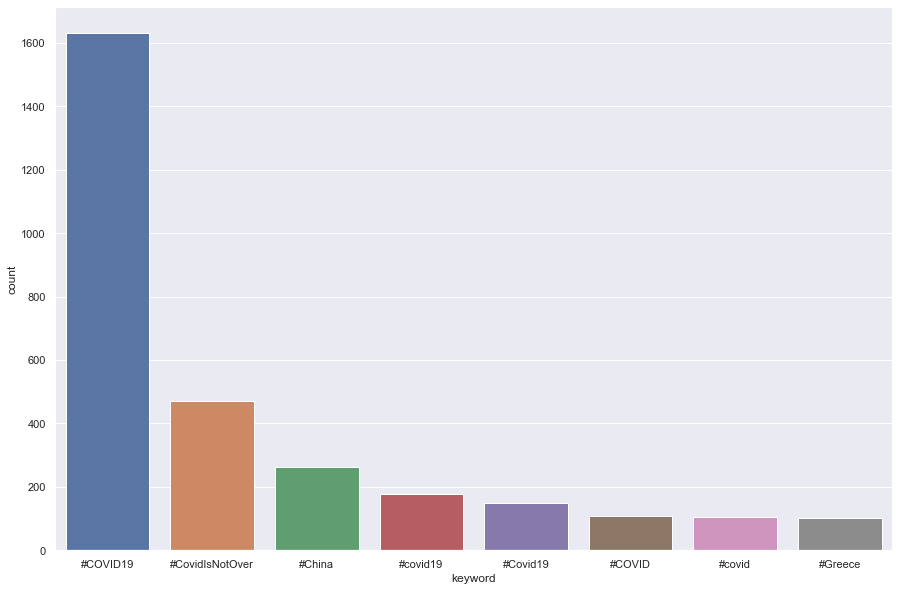

In [70]:
# Visualize the filtered dataset using barplots
sns.set(rc = {'figure.figsize': (15,10)})
sns.barplot(x = 'keyword', y = 'count', data = data_visuals)

# Text review

* We can look into the tweets in more detail to analyze the text as well for frequenty occuring words apart from the hashtags

In [74]:
# Getting the nltk library as per this post https://www.codegrepper.com/code-examples/python/stop+words+list+python
import nltk
nltk.download('stopwords') 
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize 

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\patri\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [76]:
# Get the list of stopwords 
stop_words = set(stopwords.words('english')) 

print(stop_words)

{'d', 'weren', 'up', 'doesn', 'own', "didn't", 'she', 'why', 'having', 'me', 'and', 'just', 'who', 'which', 'as', 'theirs', 'hasn', 'haven', "hadn't", 'ain', "weren't", 'any', "you'll", "isn't", 'itself', 'not', "you've", 'himself', "haven't", 'herself', 'by', 'both', 'off', 'during', "wasn't", 'her', 'when', 'do', 'its', 'of', 'we', 'below', 'should', 'if', 'yours', 'there', 'most', 'this', 'very', 'are', 'above', 'hadn', 'such', 'now', 'were', 'have', 'm', "you'd", 'our', 'you', 'how', 'under', 'here', 'they', 'has', 'your', 'after', 'to', 'further', 'he', 'ours', 'mightn', 'through', "mightn't", 'can', 'shan', 'themselves', 'doing', 'nor', 'y', 'hers', 'once', 're', "shouldn't", 'but', "hasn't", 'no', 'does', 'because', 'that', "you're", 'before', 'them', 'down', 'where', 'what', 't', 'o', 'ma', 'from', "doesn't", 'while', 'didn', "should've", "aren't", 'i', 'couldn', 'being', 'those', 'on', 'few', 'same', "won't", 'was', 'for', "mustn't", 'against', 'all', 'been', 'so', "needn't", 

In [96]:
# Convert the set into a list
stop_words = list(stop_words)
stop_words.extend(['&amp;'])
print(stop_words)

['d', 'weren', 'up', 'doesn', 'own', "didn't", 'she', 'why', 'having', 'me', 'and', 'just', 'who', 'which', 'as', 'theirs', 'hasn', 'haven', "hadn't", 'ain', "weren't", 'any', "you'll", "isn't", 'itself', 'not', "you've", 'himself', "haven't", 'herself', 'by', 'both', 'off', 'during', "wasn't", 'her', 'when', 'do', 'its', 'of', 'we', 'below', 'should', 'if', 'yours', 'there', 'most', 'this', 'very', 'are', 'above', 'hadn', 'such', 'now', 'were', 'have', 'm', "you'd", 'our', 'you', 'how', 'under', 'here', 'they', 'has', 'your', 'after', 'to', 'further', 'he', 'ours', 'mightn', 'through', "mightn't", 'can', 'shan', 'themselves', 'doing', 'nor', 'y', 'hers', 'once', 're', "shouldn't", 'but', "hasn't", 'no', 'does', 'because', 'that', "you're", 'before', 'them', 'down', 'where', 'what', 't', 'o', 'ma', 'from', "doesn't", 'while', 'didn', "should've", "aren't", 'i', 'couldn', 'being', 'those', 'on', 'few', 'same', "won't", 'was', 'for', "mustn't", 'against', 'all', 'been', 'so', "needn't", 

In [97]:
# Convert the text of tweets to a list
tweets_text_values = tweets_text.values

# Convert each of the tweets to a list of words, we do that by splitting for the spaces ' '
tweets_text_values_words = [x.split(' ') for x in tweets_text_values]

# Create an empty list to store the values later on. 
tweets_text_words = []

# Append the list we created and remove the https, mentions and selected keywords 
tweets_text_words = [z for y in tweets_text_values_words for z in y\
                    if 'http' not in z and not z.startswith(('@', '#')) and z.lower()\
                    not in stop_words]

# Create a series with the value counts of keywords
tweets_text_words = pd.Series(tweets_text_words).value_counts()

In [89]:
tweets_text_words.head(50)

               1738
&amp;           424
Covid           348
people          303
Greece          275
COVID-19        267
cases           228
Athens,         211
Athens          209
new             205
COVID           198
Covid-19        153
vaccine         147
COVID19         143
China           141
covid           140
May             136
|               129
per             126
I’m             125
like            125
way             124
cause           118
get             118
still           113
safe            111
New             111
via             110
first           108
pandemic        106
Please          104
may             101
join            100
–                99
said             97
protection       96
reported         95
Coronavirus      94
one              94
sign             91
safe.            90
Deaths           90
Health           89
positive         88
stand            87
urgently         86
urging           86
2022             86
denied           86
Day              86


In [98]:
# We will use this series wo create a dataframe to visualize it

data_visuals = pd.DataFrame(tweets_text_words.head(16)).reset_index()

# Rename the columns
data_visuals.columns = ['word', 'count']

In [99]:
# Display the result
data_visuals = data_visuals[data_visuals['word'].str.strip('word') != '']
data_visuals

,word,count
1,Covid,348
2,people,303
3,Greece,275
4,COVID-19,267
5,cases,228
6,"Athens,",211
7,Athens,209
8,new,205
9,COVID,198
10,Covid-19,153


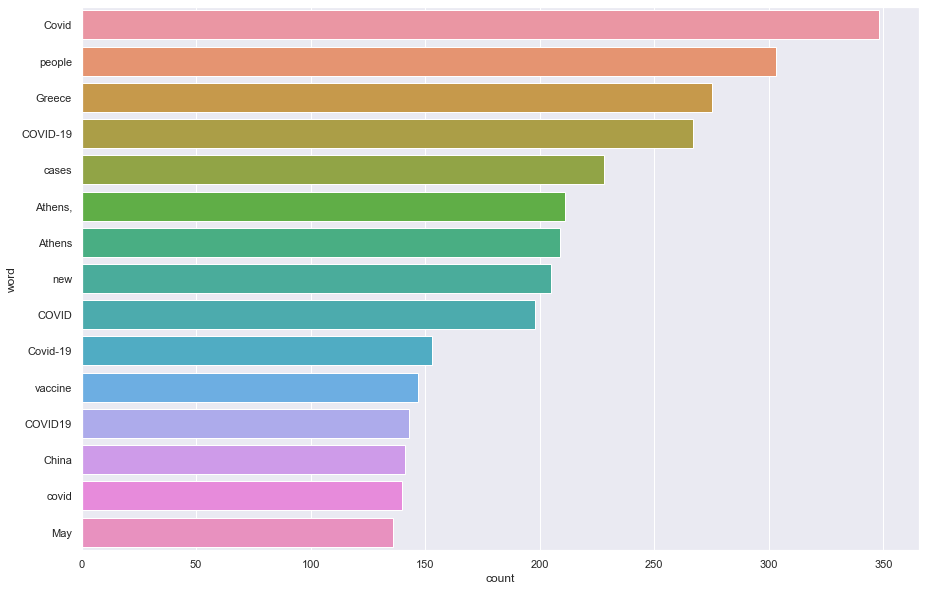

In [100]:
# Display the counts in a horizontal bar chart
word_count = sns.barplot(x = 'count', y = 'word', data = data_visuals)

### Finally look at the tweets that contain the keywords

* For this analysis I will be taking cases and vaccine

In [101]:
tweets_text = pd.DataFrame(tweets_text_values)
tweets_text.columns = ['Tweets']

In [103]:
# Create a subset that contains only 'cases' and 'vaccine'. We can replace the keywords with anything we want from our visual
tweet_subset = tweets_text[tweets_text['Tweets'].str.contains('cases', 'vaccine')]

# Loop through the dataframe and print each element
for i in tweet_subset.index:
    print('Tweeet: ', i)
    print(tweet_subset.loc[i,'Tweets'], '\n')

Tweeet:  38
More than 90% of those infected with COVID-19 show no symptoms
but the rest of the infected cases had either Type 2 diabetes, cardiovascular diseases, hypertension, and/or cancer, which means people with obesity  show severe symptoms.
#paraphrase
#COVID19
https://t.co/ZEtNx7f4jE 

Tweeet:  65
The CDC investigates mysterious cases of #PediatricHepatitis. Find out about this and more, including stories on diabetes' effect on #COVID19 outcomes and prioritization of future #cancer prevention for adolescent and young adult cancer survivors.
https://t.co/VlHgXy6Afg 

Tweeet:  77
Pregnant women have a low risk of having severe symptoms; however, in some cases -- especially those with obesity or gestational diabetes, or who are old, or who have underlying diseases -- they may have severe symptoms. 

#COVID19 https://t.co/4SG3GAMx04 

Tweeet:  190
Public Health Ontario's latest data on #COVID19 cases in ON, incl TO, is now available: https://t.co/oUxcc69p2S. 

TPH's case counts dash